# Stock Market Exploratory Data Analysis (EDA)

## Purpose
This phase of the project focuses on conducting an in-depth exploratory data analysis (EDA) of the selected stock. The goal is to extract valuable insights and explore key statistics that will lay the foundation for building a robust stock market forecasting system capable of providing actionable recommendations—Buy, Sell, or Hold.
### 1.0 Load Data and Calculate Key Statistics

## Potential stocks of interest 
    - AMD  
    - AAPL
    - AMD


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import mplfinance as mpf
import plotly.graph_objects as go


company_df = pd.read_csv('data/sp500_companies.csv')
stock_df = pd.read_csv('data/sp500_stocks.csv')


In [2]:

# Assuming stock_df is your DataFrame
stock_df['Date'] = pd.to_datetime(stock_df['Date'])

stock_df['MA_10'] = stock_df.groupby('Symbol')['Close'].rolling(window=10).mean().reset_index(level=0, drop=True)
stock_df['MA_20'] = stock_df.groupby('Symbol')['Close'].rolling(window=20).mean().reset_index(level=0, drop=True)
stock_df['MA_50'] = stock_df.groupby('Symbol')['Close'].rolling(window=50).mean().reset_index(level=0, drop=True)
stock_df['MA_200'] = stock_df.groupby('Symbol')['Close'].rolling(window=200).mean().reset_index(level=0, drop=True)
stock_df['std_10'] = stock_df.groupby('Symbol')['Close'].rolling(window=10).std().reset_index(level=0, drop=True)
stock_df['std_20'] = stock_df.groupby('Symbol')['Close'].rolling(window=20).std().reset_index(level=0, drop=True)
stock_df['std_50'] = stock_df.groupby('Symbol')['Close'].rolling(window=50).std().reset_index(level=0, drop=True)
stock_df['std_200'] = stock_df.groupby('Symbol')['Close'].rolling(window=200).std().reset_index(level=0, drop=True)


In [3]:

stock_df['upper_band_10'] = stock_df['MA_10'] + (stock_df['std_10'] * 2)
stock_df['lower_band_10'] = stock_df['MA_10'] - (stock_df['std_10'] * 2)

stock_df['upper_band_20'] = stock_df['MA_20'] + (stock_df['std_20'] * 2)
stock_df['lower_band_20'] = stock_df['MA_20'] - (stock_df['std_20'] * 2)

stock_df['upper_band_50'] = stock_df['MA_50'] + (stock_df['std_50'] * 2)
stock_df['lower_band_50'] = stock_df['MA_50'] - (stock_df['std_50'] * 2)


stock_df['upper_band_200'] = stock_df['MA_200'] + (stock_df['std_200'] * 2)
stock_df['lower_band_200'] = stock_df['MA_200'] - (stock_df['std_200'] * 2)

In [4]:
stock_df['Golden_Cross_Short'] = np.where((stock_df['MA_10'] > stock_df['MA_20']) & (stock_df['MA_10'].shift(1) <= stock_df['MA_20'].shift(1)), 1, 0)
stock_df['Golden_Cross_Medium'] = np.where((stock_df['MA_20'] > stock_df['MA_50']) & (stock_df['MA_20'].shift(1) <= stock_df['MA_50'].shift(1)), 1, 0)
stock_df['Golden_Cross_Long'] = np.where((stock_df['MA_50'] > stock_df['MA_200']) & (stock_df['MA_50'].shift(1) <= stock_df['MA_200'].shift(1)), 1, 0)

stock_df['Death_Cross_Short'] = np.where((stock_df['MA_10'] < stock_df['MA_20']) & (stock_df['MA_10'].shift(1) >= stock_df['MA_20'].shift(1)), 1, 0)
stock_df['Death_Cross_Medium'] = np.where((stock_df['MA_20'] < stock_df['MA_50']) & (stock_df['MA_20'].shift(1) >= stock_df['MA_50'].shift(1)), 1, 0)
stock_df['Death_Cross_Long'] = np.where((stock_df['MA_50'] < stock_df['MA_200']) & (stock_df['MA_50'].shift(1) >= stock_df['MA_200'].shift(1)), 1, 0)

In [5]:
import pandas as pd

def calculate_macd(df, short_window=12, long_window=26, signal_window=9):
    # Calculate the short-term EMA
    df['EMA_short'] = df['Close'].ewm(span=short_window, adjust=False).mean()
    
    # Calculate the long-term EMA
    df['EMA_long'] = df['Close'].ewm(span=long_window, adjust=False).mean()
    
    # Calculate the MACD line
    df['MACD'] = df['EMA_short'] - df['EMA_long']
    
    # Calculate the Signal line
    df['Signal'] = df['MACD'].ewm(span=signal_window, adjust=False).mean()
    
    # Calculate the MACD histogram
    df['MACD_Hist'] = df['MACD'] - df['Signal']
    
    return df

stock_df = calculate_macd(stock_df)

In [6]:
import pandas as pd

stock_df['Previous_Close'] = stock_df['Close'].shift(1)

# True Range, Shows the volatility of the stock
stock_df['TR'] = stock_df.apply(
    lambda row: max(
        row['High'] - row['Low'],  # High - Low
        abs(row['High'] - row['Previous_Close']),  # |High - Previous Close|
        abs(row['Low'] - row['Previous_Close'])  # |Low - Previous Close|
    ), axis=1
)

# Average True Range, Shows the average volatility of the stock
stock_df['ATR'] = stock_df['TR'].rolling(window=10).mean()

In [7]:
def calculate_rsi(df, window=10):
    # Calculate daily price changes
    delta = df['Close'].diff()

    # Separate gains and losses
    gain = delta.where(delta > 0, 0)
    loss = -delta.where(delta < 0, 0)

    # Calculate the average gain and average loss
    avg_gain = gain.rolling(window=window, min_periods=1).mean()
    avg_loss = loss.rolling(window=window, min_periods=1).mean()

    # Calculate the Relative Strength (RS)
    rs = avg_gain / avg_loss

    # Calculate the RSI
    rsi = 100 - (100 / (1 + rs))

    return rsi

# Add RSI column to the DataFrame
stock_df['RSI_10_Day'] = calculate_rsi(stock_df)

In [8]:
# Rate of Change, Shows the momentum of the stock
stock_df['10_Day_ROC'] = ((stock_df['Close'] - stock_df['Close'].shift(10)) / stock_df['Close'].shift(10)) * 100

In [9]:

stock_df['Z-score'] = (stock_df['Close'] - stock_df['Close'].mean()) / stock_df['Close'].std()
stock_df['Daily Return'] = stock_df.groupby('Symbol')['Close'].pct_change(fill_method=None).reset_index(level=0, drop=True)


### Preview Data with Additional Columns

In [10]:
company_df.fillna(0, inplace=True)
# stock_df.fillna(0, inplace=True)
stock_df.to_csv('data/sp500_stocks_extra_columns.csv', index=False)

In [166]:
stock_df.columns

Index(['Date', 'Symbol', 'Adj Close', 'Close', 'High', 'Low', 'Open', 'Volume',
       'MA_10', 'MA_20', 'MA_50', 'MA_200', 'std_10', 'std_20', 'std_50',
       'std_200', 'upper_band_10', 'lower_band_10', 'upper_band_20',
       'lower_band_20', 'upper_band_50', 'lower_band_50', 'upper_band_200',
       'lower_band_200', 'Golden_Cross_Short', 'Golden_Cross_Medium',
       'Golden_Cross_Long', 'Death_Cross_Short', 'Death_Cross_Medium',
       'Death_Cross_Long', 'EMA_short', 'EMA_long', 'MACD', 'Signal',
       'MACD_Hist', 'Previous_Close', 'TR', 'ATR', 'RSI_10_Day', '10_Day_ROC',
       'Z-score', 'Daily Return'],
      dtype='object')

### Column Descriptions 

- **Date**: The date of the stock data entry. 
- **Symbol**: The ticker symbol representing the stock.
- **Adj Close**: The adjusted closing price of the stock, accounting for corporate actions like dividends and stock splits.
- **Close**: The closing price of the stock on the given date.
- **High**: The highest price at which the stock traded during the day.
- **Low**: The lowest price at which the stock traded during the day.
- **Open**: The opening price of the stock on the given date.
- **Volume**: The number of shares traded during the day.
- **MA_10**: The 10-day moving average of the stock's closing price.
- **MA_20**: The 20-day moving average of the stock's closing price.
- **MA_50**: The 50-day moving average of the stock's closing price.
- **MA_200**: The 200-day moving average of the stock's closing price.
- **std_10**: The standard deviation of the stock's closing price over the past 10 days.
- **std_20**: The standard deviation of the stock's closing price over the past 20 days.
- **std_50**: The standard deviation of the stock's closing price over the past 50 days.
- **std_200**: The standard deviation of the stock's closing price over the past 200 days.
- **upper_band_10**: The upper Bollinger Band based on the 10-day moving average and standard deviation.
- **lower_band_10**: The lower Bollinger Band based on the 10-day moving average and standard deviation.
- **upper_band_20**: The upper Bollinger Band based on the 20-day moving average and standard deviation.
- **lower_band_20**: The lower Bollinger Band based on the 20-day moving average and standard deviation.
- **upper_band_50**: The upper Bollinger Band based on the 50-day moving average and standard deviation.
- **lower_band_50**: The lower Bollinger Band based on the 50-day moving average and standard deviation.
- **upper_band_200**: The upper Bollinger Band based on the 200-day moving average and standard deviation.
- **lower_band_200**: The lower Bollinger Band based on the 200-day moving average and standard deviation.
- **Golden_Cross_Short**: Indicator for a short-term golden cross, where the 10-day moving average crosses above the 20-day moving average.
- **Golden_Cross_Medium**: Indicator for a medium-term golden cross, where the 20-day moving average crosses above the 50-day moving average.
- **Golden_Cross_Long**: Indicator for a long-term golden cross, where the 50-day moving average crosses above the 200-day moving average.
- **Death_Cross_Short**: Indicator for a short-term death cross, where the 10-day moving average crosses below the 20-day moving average.
- **Death_Cross_Medium**: Indicator for a medium-term death cross, where the 20-day moving average crosses below the 50-day moving average.
- **Death_Cross_Long**: Indicator for a long-term death cross, where the 50-day moving average crosses below the 200-day moving average.
- **EMA_short**: The short-term Exponential Moving Average (EMA) of the stock's closing price.
- **EMA_long**: The long-term Exponential Moving Average (EMA) of the stock's closing price.
- **MACD**: The Moving Average Convergence Divergence, calculated as the difference between the short-term EMA and the long-term EMA.
- **Signal**: The signal line for the MACD, which is the EMA of the MACD line.
- **MACD_Hist**: The MACD histogram, calculated as the difference between the MACD line and the signal line.
- **Previous_Close**: The closing price of the stock on the previous trading day.
- **TR**: The True Range, a measure of the stock's volatility.
- **ATR**: The Average True Range, the moving average of the True Range, indicating the average volatility.
- **RSI_10_Day**: The 10-day Relative Strength Index, a momentum oscillator that measures the speed and change of price movements.
- **10_Day_ROC**: The 10-day Rate of Change, showing the percentage change in the stock's closing price over the past 10 days.
- **Z-score**: The Z-score of the stock's closing price, indicating how many standard deviations the closing price is from the mean.
- **Daily Return**: The daily return of the stock, calculated as the percentage change in the closing price from the previous day.

### Visualize Data
#### Line Chart of Closing Price

In [167]:
alt.data_transformers.disable_max_rows()
def plot_closing_price(df, company,opacity=1):
    filtered_df = df[df['Symbol'] == company]
    chart = alt.Chart(filtered_df).mark_line(color='black', opacity=opacity).encode(
        alt.X('Date:T', title='Date'),
        alt.Y('Close:Q', title='Closing Price'),
        alt.Tooltip(['Date:T', 'Close:Q', 'Volume:Q','RSI_10_Day']),
    ).properties(
        title=f'{company} Closing Price',
        width=800,
        height=400
    ).interactive(
        bind_y=False
    )
    return chart
plot_closing_price(stock_df, 'AMD')

alt.Chart(...)

This graph of the closing prices over time allowing us to see the relative trents that AMD has previously had. We can see an upward trend from 2010 until around 2022, this can likely be explained by the pandemic effecting the market as a whole. We can see that toward the end of 2022 another upward trend begins until around Q2 in 2024. 
#### CandleStick Chart

In [168]:

def plot_candlestick(df, company,window:list = None):
    filtered_df = df[df['Symbol'] == company]
    filtered_df = filtered_df[filtered_df['Date'] >= window[0]]
    filtered_df = filtered_df[filtered_df['Date'] <= window[1]]
    filtered_df['Date'] = pd.to_datetime(filtered_df['Date'])
    df = filtered_df
    candlestick = go.Candlestick(
        x=df['Date'],
        open=df['Open'],
        high=df['High'],
        low=df['Low'],
        close=df['Close'],
        name='Candlestick'
        )
    
    volume = go.Bar(
        x=df['Date'],
        y=df['Volume'],
        name='Volume',
        marker_color='blue',
        opacity=0.5,
        yaxis='y2'
    )

    layout = go.Layout(
        title= f'{company} Candlestick Chart From {window[0]} to {window[1]}',
        xaxis=dict(title='Date'),
        yaxis=dict(title='Price', showgrid=True),
        yaxis2=dict(title='Volume', overlaying='y', side='right', showgrid=False),
        xaxis_rangeslider_visible=False,
        hovermode='x unified',
        plot_bgcolor='white'
    )

    fig = go.Figure(
        data=[candlestick, volume],
        layout=layout
        )
    fig.show()
plot_candlestick(stock_df, 'AMD', window=['2024-07-01', '2024-10-01'])

This Candlestick chart allows us to see daily price movement of the stock (open, high, low, close) and other patterns to help predict future price. If we Zoom in on points where the stock trend changes we can see patterns the candlesticks reveal such as engulfing candles where the body of one candle is larger than the entire previous candle indicating which could help comfirm an exsisting trend or suggest a new one. 

In [169]:
def plot_moving_average(df, company, color, MA,term):
    filtered_df = df[df['Symbol'] == company]
    chart = alt.Chart(filtered_df).mark_line(color=color).encode(
        alt.X('Date:T', title='Date'),
        alt.Y(f'{MA}:Q', title='{MA}'),
        alt.Tooltip([MA,'Date', 'Close:Q', 'Volume:Q', 'Death_Cross_Short:O', 'Golden_Cross_Short:O', 'Death_Cross_Long:O', 'Golden_Cross_Long:O'])
    ).properties(
        title=f'{company} Moving Average {term}',
        width=800,
        height=400
    ).interactive(
        bind_y=False
    )

    
    return chart
closing_price = plot_closing_price(stock_df, 'AMD', 0.5)
MA_10 = plot_moving_average(stock_df, 'AMD', 'green', 'MA_10','Short Term')
MA_20 = plot_moving_average(stock_df, 'AMD', 'blue', 'MA_20','Short Term')

MA_50 = plot_moving_average(stock_df, 'AMD', 'red', 'MA_50','Long Term')
MA_200 = plot_moving_average(stock_df, 'AMD', 'purple', 'MA_200','Long Term')
short_term_MA = alt.layer(MA_10, MA_20, closing_price)
medium_term_MA = alt.layer(MA_200, MA_50, closing_price)
MA_charts = alt.vconcat(short_term_MA, medium_term_MA)
MA_charts

alt.VConcatChart(...)

These charts are of the short term and long term moving averages. The top chart has the 10 moving average in green and the 20 day moving average in blue: both charts have an opace black line representing closing price. When the 20 day average crosses below the 10 day average it indicates a possible short term dip, and if the short term crosses above the long term it indicates a possible short term rise. This logic can also be applied to the long term moving averages allowing us to gauge and make an educated guess on stock movement over time. 

#### Bollinger Bands

In [171]:
def plot_bollinger_bands(df, company, band):
    df = df[df['Symbol'] == company]

    fig = go.Figure()

    fig.add_trace(
        go.Scatter(
            x=df['Date'],
            y=df['Close'],
            mode='lines',
            name='Close Price'
        )
    )

    fig.add_trace(
        go.Scatter(
            x=df['Date'],
            y=df[f'upper_band_{band}'],
            mode='lines',
            name='Upper Band',
            line=dict(color='red', width=1)
        )
    )

    fig.add_trace(
        go.Scatter(
            x=df['Date'],
            y=df[f'lower_band_{band}'],
            mode='lines',
            name='Lower Band',
            line=dict(color='red', width=1)
        )
    )

    fig.add_trace(
        go.Scatter(
            x=df['Date'],
            y=df[f'upper_band_{band}'],
            mode='lines',
            line=dict(width=0),
            showlegend=False,
            hoverinfo='skip'
        ))

    fig.add_trace(
        go.Scatter(
            x=df['Date'], y=df[f'lower_band_{band}'],
            mode='lines',
            line=dict(width=0),
            fill='tonexty',
            fillcolor='rgba(128, 128, 128, 0.2)',
            showlegend=False,
            hoverinfo='skip'
        ))

    # Update layout
    fig.update_layout(
        title=f'Bollinger Bands for {band} Day Moving Average',
        xaxis_title='Date',
        yaxis_title='Price',
        legend_title='Legend',
        width=1000,
        height=600
    )

    fig.show()

band_10 = plot_bollinger_bands(stock_df, 'AMD', 10)
band_20 = plot_bollinger_bands(stock_df, 'AMD', 20)
band_50 = plot_bollinger_bands(stock_df, 'AMD', 50)
# band_200 = plot_bollinger_bands(stock_df, 'AMD', 200)

These are the bollinger bands for AMD and show us the volatility of the stock each chart is based of a band with a diffrent moving average. The higher moving averages allow us to tell us what scale the stock is volitile on. When bands are wider it indicates higher volitility while narrow bands indicate lower volatility. When the stock crosses a higher band meaning it is overbought we can see that it often has a large dip and vis-versa. 

#### Relative Strength Index

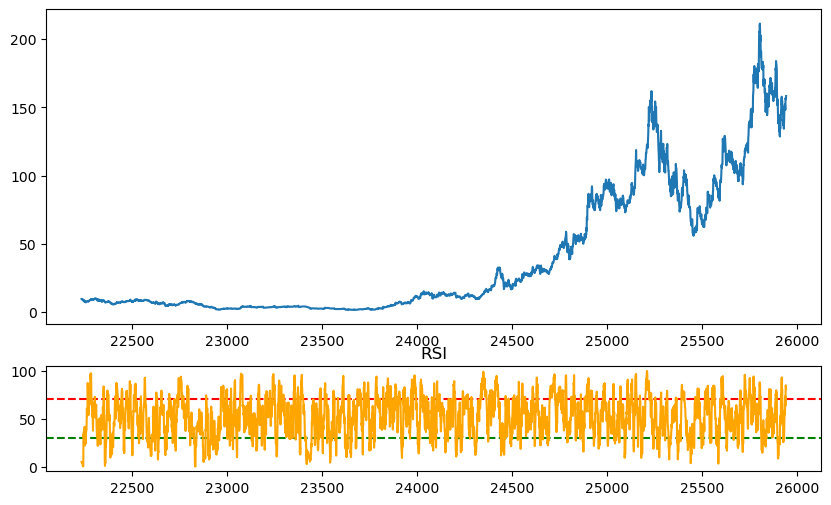

In [172]:
def plot_RSI(df, company):
    filtered_df = df[df['Symbol'] == company]
    fig, axs = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]}, figsize=(10, 6))

    axs[0].plot(filtered_df['Close'])
    axs[1].axhline(y=70, color='red', linestyle='--')
    axs[1].axhline(y=30, color='green', linestyle='--')
    axs[1].plot(filtered_df['RSI_10_Day'], color='orange')
    axs[1].set_title('RSI')
    plt.show()
plot_RSI(stock_df, 'AMD')

This is a plot of the RSI and closing price with indicators at 70% and 30% to indicate times when the stock might be overbought or under valued.

In [173]:
from plotly.subplots import make_subplots

def plot_MACD(df, company, start, stop):
    # Filter the DataFrame for the specified company and date range
    df = df[(df['Symbol'] == company) & (df['Date'] >= start) & (df['Date'] <= stop)]
    
    # Create a Plotly figure with two subplots
    fig = make_subplots(
        rows=2, 
        cols=1, 
        shared_xaxes=True, 
        vertical_spacing=0.1, 
        subplot_titles=('Close Price', 'MACD')
        )
    
    # Add Close Price trace
    fig.add_trace(go.Scatter(
        x=df['Date'], y=df['Close'],
        mode='lines',
        name='Close Price'
    ), row=1, col=1)
    
    # Add MACD line trace
    fig.add_trace(go.Scatter(
        x=df['Date'], y=df['MACD'],
        mode='lines',
        name='MACD',
        line=dict(color='red')
    ), row=2, col=1)
    
    # Add Signal line trace
    fig.add_trace(go.Scatter(
        x=df['Date'], y=df['Signal'],
        mode='lines',
        name='Signal',
        line=dict(color='blue')
    ), row=2, col=1)
    
    # Add MACD histogram trace
    fig.add_trace(go.Bar(
        x=df['Date'], y=df['MACD_Hist'],
        name='MACD Histogram',
        marker_color=['green' if x > 0 else 'red' for x in df['MACD_Hist']]
    ), row=2, col=1)
    
    # Update layout
    fig.update_layout(
        title=f'MACD for {company}',
        xaxis_title='Date',
        yaxis_title='Price',
        legend_title='Legend',
        width=1000,
        height=600
    )
    
    fig.show()

# Example usage
plot_MACD(stock_df, 'AMD', '2024-01-01', '2024-10-01')

This graph shows us the MACD and signal patterns next to the closing price, when the MACD is above the signal it could indicate buy times and when below it indicates sell. This chart allows us to see how the signals played out in the passed if traded on.

In [174]:
def set_target(df, company, target):
    filtered_df = df[df['Symbol'] == company].copy()
    filtered_df['Target'] = filtered_df['Close'].shift(-target)
    filtered_df['Target'] = [1 if filtered_df['Close'].iloc[i] < filtered_df['Target'].iloc[i] else 0 for i in range(len(filtered_df))]
    return filtered_df